In [2]:
import numpy as np
import xarray as xr
import matplotlib.pyplot as plt
import sys
sys.path.append('/home/a/a270166/modules/tripyview/')
import tripyview as tpv
import pickle
sys.path.append('/home/a/a270166/modules/xgcm/')
import xgcm
sys.path.append('/home/a/a270166/modules/eddytoolsnb')
import eddytools as et
import pandas as pd
import math
from cmocean import cm as cmo
import matplotlib.path as mpath
import cartopy.crs as ccrs
import scipy.stats as st
from scipy.spatial import cKDTree


/home/a/a270166/modules/tripyview


In [2]:
figpath='/PATH/TO/OUTPUT/'
datapath='/PATH/TO/TRACKED/EDDIES/'
meshpath='/PATH/TO/MESH/'

In [3]:
def simple_plot(dpi=300,
                ygridlocs=[-80,-75,-70,-65,-60],
                figsize=(6,6),
                box=[-180,180,-80,-60],
                cols=1,
                rows=1,
               ):
    
    fig, axes = plt.subplots(
                rows,cols,
                subplot_kw=dict(projection=ccrs.SouthPolarStereo()),
                constrained_layout=True,
                figsize=figsize,
                dpi=dpi,
                # facecolor='lightgrey',
            )
    if isinstance(axes, np.ndarray):
        axesflat = axes.flatten()
    else:
        axesflat = [axesflat]
    for ax in axesflat:
        ax.set_extent(box, crs=ccrs.PlateCarree())
        theta = np.linspace(0, 2*np.pi, 100)
        center, radius = [0.5, 0.505], 0.5
        verts = np.vstack([np.sin(theta), np.cos(theta)]).T
        circle = mpath.Path(verts * radius + center)

        ax.set_boundary(circle, transform=ax.transAxes)
        ax.gridlines(crs=ccrs.PlateCarree(), draw_labels=False, linewidth=0.5, \
                xlocs=range(-180,171,30), ylocs=[], \
                color='gray', alpha=0.5, linestyle='--', zorder=10)
        # Draw concentric circles (but hide labels) for the parallels of the latitude
        ax.gridlines(crs=ccrs.PlateCarree(), draw_labels=False, linewidth=0.5, \
                        xlocs=[], ylocs=ygridlocs, \
                        color='grey', alpha=0.5, linestyle='--', zorder=10)

        # ax.coastlines(lw=0.5, resolution="110m", facecolor='k',zorder=101)

    return fig, axes


In [ ]:
mesh=tpv.load_mesh_fesom2(meshpath, do_rot='None', focus=0, do_info=False, do_pickle=False,
                          do_earea=False, do_narea=False, do_eresol=[False,'mean'], do_nresol=[False,'eresol'])


In [5]:
with open(datapath+'so3_et_track_95m_12km_10-100kmbp_np100_owthr01_'+str(1951)+'-'+str(1956)+'.pickle','rb') as f:
        t50=pickle.load(f)
with open(datapath+'so3_et_track_95m_12km_10-100kmbp_np100_owthr01_'+str(2091)+'-'+str(2096)+'.pickle','rb') as f:
        t90=pickle.load(f)
f.close()

In [6]:
t50_3d=[i for i in t50 if len(i['time']) >3]
t90_3d=[i for i in t90 if len(i['time']) >3]

In [7]:
non_station_50=[]
ns_50_travelled_speed=[]
dists_per_day50=[]
startlons50=[]
startlats50=[]
for track in t50_3d:
    dists=[]
    for i in np.arange(len(track['lon'])-1):
        dists.append(et.tracking.get_distance_latlon2m(track['lon'][i],track['lat'][i],track['lon'][i+1],track['lat'][i+1]))
    travelled=np.sum(dists)
    traversed=et.tracking.get_distance_latlon2m(track['lon'][0],track['lat'][0],track['lon'][-1],track['lat'][-1])

    if traversed/len(track['time'])>1000:
        non_station_50.append(track)
        ns_50_travelled_speed.append(travelled/len(track['time']))
        dists_per_day50.append(dists)

non_station_90=[]
ns_90_travelled_speed=[]
dists_per_day90=[]
startlons90=[]
startlats90=[]
for track in t90_3d:
    dists=[]
    for i in np.arange(len(track['lon'])-1):
        dists.append(et.tracking.get_distance_latlon2m(track['lon'][i],track['lat'][i],track['lon'][i+1],track['lat'][i+1]))
    travelled=np.sum(dists)
    traversed=et.tracking.get_distance_latlon2m(track['lon'][0],track['lat'][0],track['lon'][-1],track['lat'][-1])
    
    if traversed/len(track['time'])>1000:
        non_station_90.append(track)
        ns_90_travelled_speed.append(travelled/len(track['time']))
        dists_per_day90.append(dists)
        

In [8]:
#extract date and spatial info
#each day
times50=pd.to_datetime(np.hstack([track['time'] for track in non_station_50]))
times90=pd.to_datetime(np.hstack([track['time'] for track in non_station_90]))

#genesis
timesb50=pd.to_datetime(np.hstack([track['time'][0] for track in non_station_50]))
timesb90=pd.to_datetime(np.hstack([track['time'][0] for track in non_station_90]))

#startday for daily speed
starttimes50=pd.to_datetime(np.hstack([track['time'][:-1] for track in non_station_50]))
starttimes90=pd.to_datetime(np.hstack([track['time'][:-1] for track in non_station_90]))

#all spatial
lons50=np.hstack([track['lon'] for track in non_station_50])
lons90=np.hstack([track['lon'] for track in non_station_90])

lats50=np.hstack([track['lat'] for track in non_station_50])
lats90=np.hstack([track['lat'] for track in non_station_90])

#genesis spatial
lonb50=np.hstack([track['lon'][0] for track in non_station_50])
lonb90=np.hstack([track['lon'][0] for track in non_station_90])

latb50=np.hstack([track['lat'][0] for track in non_station_50])
latb90=np.hstack([track['lat'][0] for track in non_station_90])

# Starting coords for daily speed
startlons50=np.hstack([track['lon'][:-1]for track in non_station_50])
startlons90=np.hstack([track['lon'][:-1]for track in non_station_90])

startlats50=np.hstack([track['lat'][:-1]for track in non_station_50])
startlats90=np.hstack([track['lat'][:-1]for track in non_station_90])

In [9]:
#extract eddy properties
lts_50=np.hstack([len(track['time']) for track in non_station_50])
lts_90=np.hstack([len(track['time']) for track in non_station_90])

dailyspeed50=np.hstack([dists_per_day50[i] for i in np.arange(len(non_station_50))])
dailyspeed90=np.hstack([dists_per_day90[i] for i in np.arange(len(non_station_90))])

area_50=np.hstack([track['area'] for track in non_station_50])
area_90=np.hstack([track['area'] for track in non_station_90])

amps_50=np.hstack([track['amp'] for track in non_station_50])
amps_90=np.hstack([track['amp'] for track in non_station_90])

In [10]:
#compute eddy statistics

In [11]:
def simple_plot(dpi=300,
                ygridlocs=[-80,-75,-70,-65,-60],
                figsize=(6,6),
                box=[-180,180,-80,-60],
                cols=1,
                rows=1,
               ):
    
    fig, axes = plt.subplots(
                rows,cols,
                subplot_kw=dict(projection=ccrs.SouthPolarStereo()),
                constrained_layout=True,
                figsize=figsize,
                dpi=dpi,
                # facecolor='lightgrey',
            )
    if isinstance(axes, np.ndarray):
        axesflat = axes.flatten()
    else:
        axesflat = [axesflat]
    for ax in axesflat:
        ax.set_extent(box, crs=ccrs.PlateCarree())
        theta = np.linspace(0, 2*np.pi, 100)
        center, radius = [0.5, 0.505], 0.5
        verts = np.vstack([np.sin(theta), np.cos(theta)]).T
        circle = mpath.Path(verts * radius + center)

        ax.set_boundary(circle, transform=ax.transAxes)
        ax.gridlines(crs=ccrs.PlateCarree(), draw_labels=False, linewidth=0.5, \
                xlocs=range(-180,171,30), ylocs=[], \
                color='gray', alpha=0.5, linestyle='--', zorder=10)
        # Draw concentric circles (but hide labels) for the parallels of the latitude
        ax.gridlines(crs=ccrs.PlateCarree(), draw_labels=False, linewidth=0.5, \
                        xlocs=[], ylocs=ygridlocs, \
                        color='grey', alpha=0.5, linestyle='--', zorder=10)

        # ax.coastlines(lw=0.5, resolution="110m", facecolor='k',zorder=101)

    return fig, axes


In [4]:
def define_grid(gridtype='reg',bounds=[-180,180,-80,90],dx=1,dy=1,periodic=True):
    left,right,bottom,top=bounds
    #variables we want to keep
    global lons_c, lats_c, lons_gl, lats_gl, lons_gr, lats_gr, lats_g, \
    vpointslonl, vpointslatl, vpointslonr, vpointslatr, upointslonl, upointslatl, upointslonr, \
    upointslatr, cpointslon, cpointslat, fpointslonl, fpointslatl, fpointslonr, fpointslatr, \
    dxF, dyF, dxC, dyC, dxG, dyG, dxV, dyU 
    
    if gridtype=='reg':
        # the x center and f points on either side
        lons_c = np.arange(left+(0.5*dx), right, dx)
        lons_gl = np.arange(left, right, dx)
        lons_gr = lons_gl+(dx)
        
        lats_c = np.arange(bottom+(0.5*dy), top, dy)
        lats_gl = np.arange(bottom, top, dy)
        lats_gr = lats_gl+(dy)
        
    elif gridtype=='iso':
        
        # the x center and f points on either side
        lons_c = np.arange(left+(0.5*dx), right, dx)
        lons_gl = np.arange(left, right, dx)
        lons_gr = lons_gl+(dx)
        
        #the y 
        lats_g=[bottom]

        #we need one extra center lat point in order to differentiate the correct number of v points
        while lats_g[-1] < top+(dy*(np.cos(np.radians(top)))):
            lats_g.append(lats_g[-1]+dy*(np.cos(np.radians(lats_g[-1]))))

        lats_gl=lats_g[:-1]
        lats_gr=lats_g[1:]
        lats_c=(np.asarray(lats_gl)+np.asarray(lats_gr))/2

        lats_g,lats_gl,lats_gr=lats_g[:-1],lats_gl[:-1],lats_gr[:-1]
        
    else:
        print('grid type not prepared with this function')
        pass
        
    #latlon points in 2d
    vpointslonl, vpointslatl = np.meshgrid(lons_c,lats_gl)
    vpointslonr, vpointslatr = np.meshgrid(lons_c,lats_gr)

    upointslonl, upointslatl = np.meshgrid(lons_gl,lats_c)
    upointslonr, upointslatr = np.meshgrid(lons_gr,lats_c)

    cpointslon, cpointslat = np.meshgrid(lons_c,lats_c)

    fpointslonl, fpointslatl = np.meshgrid(lons_gl,lats_gl)
    fpointslonr, fpointslatr = np.meshgrid(lons_gr,lats_gr)
    
    #distances
    dxC = et.tracking.get_distance_latlon2m(cpointslon[:-1,1:],cpointslat[:-1,1:], 
                                            cpointslon[:-1,:-1],cpointslat[:-1,:-1])
    
    #we use the left lat point because we lose the top row 
    dxV = et.tracking.get_distance_latlon2m(vpointslonl[:,1:],vpointslatl[:,1:], 
                                            vpointslonl[:,:-1],vpointslatl[:,:-1])
    
    #for dxC and dxV we need to manually add the periodic distance
    if periodic:
        endcolumn=et.tracking.get_distance_latlon2m(cpointslon[:-1,0],cpointslat[:-1,0],
                                                    cpointslon[:-1,-1],cpointslat[:-1,-1])
        dxC = np.append(dxC, endcolumn.reshape((endcolumn.shape[0],1)),axis=1)
        endcolumn=et.tracking.get_distance_latlon2m(vpointslonl[:,0],vpointslatl[:,0],
                                                    vpointslonl[:,-1],vpointslatl[:,-1])
        dxV = np.append(dxV, endcolumn.reshape((endcolumn.shape[0],1)),axis=1)

    #for dyC and dyU, we lose the top row that we added above
    #*** to do: change to lose the bottom row, so that this works better in the northern hemisphere
    #the bottom row can be on land over antarctica
    dyC = et.tracking.get_distance_latlon2m(cpointslon[1:,:],cpointslat[1:,:],
                                            cpointslon[:-1,:],cpointslat[:-1,:])
    dyU = et.tracking.get_distance_latlon2m(upointslonl[1:,:],upointslatl[1:,:],
                                            upointslonl[:-1,:],upointslatl[:-1,:])

    #dxG and dyG
    dxG = et.tracking.get_distance_latlon2m(fpointslonr,fpointslatl,fpointslonl,fpointslatl)
    dyG = et.tracking.get_distance_latlon2m(fpointslonl,fpointslatr,fpointslonl,fpointslatl)

    #dxF and dyF. for dxF we have to manually remove the top layer
    dxF = et.tracking.get_distance_latlon2m(upointslonr,upointslatl,upointslonl,upointslatl)
    dxF = dxF[:-1,:]
    dyF = et.tracking.get_distance_latlon2m(vpointslonl,vpointslatr,vpointslonl,vpointslatl)
    
    lats_c=lats_c[:-1]
    cpointslat=cpointslat[:-1,:]
    upointslonl=upointslonl[:-1,:]
    upointslatl=upointslatl[:-1,:]
    upointslonr=upointslonr[:-1,:]
    upointslatr=upointslatr[:-1,:]
    
define_grid('iso',[-180,180,-80,-60+0.6],dx=0.6,dy=0.6, periodic=True)

In [13]:
xbins=np.append(upointslonl[0],[180])
ybins=upointslatl[:,0]
bin_areas=(dxV/1000)*(dyU/1000) #in km^2

In [14]:
#eddy vorticity amplitude
amp_50_binned=st.binned_statistic_2d(np.hstack(lons50),np.hstack(lats50), np.hstack(amps_50),statistic='mean',bins=[xbins,ybins],expand_binnumbers=True)
amp_90_binned=st.binned_statistic_2d(np.hstack(lons90),np.hstack(lats90), np.hstack(amps_90),statistic='mean',bins=[xbins,ybins],expand_binnumbers=True)

In [15]:
#eddy lifespan
lts_50_binned=st.binned_statistic_2d(lonb50, latb50, lts_50,statistic='mean',bins=[xbins,ybins],expand_binnumbers=True)
lts_90_binned=st.binned_statistic_2d(lonb90, latb90, lts_90,statistic='mean',bins=[xbins,ybins],expand_binnumbers=True)

In [16]:
#eddy area
area_50_binned=st.binned_statistic_2d(np.hstack(lons50),np.hstack(lats50), np.hstack(area_50),statistic='mean',bins=[xbins,ybins],expand_binnumbers=True)
area_90_binned=st.binned_statistic_2d(np.hstack(lons90),np.hstack(lats90), np.hstack(area_90),statistic='mean',bins=[xbins,ybins],expand_binnumbers=True)

In [17]:
#eddy daily speed
dailyspeed_50_binned=st.binned_statistic_2d(startlons50,startlats50,dailyspeed50,statistic='mean',bins=[xbins,ybins],expand_binnumbers=True)
dailyspeed_90_binned=st.binned_statistic_2d(startlons90,startlats90,dailyspeed90,statistic='mean',bins=[xbins,ybins],expand_binnumbers=True)

In [18]:
#eddy presence total
ep_50_binned=st.binned_statistic_2d(np.hstack(lons50),np.hstack(lats50),np.hstack(lons50),statistic='count',bins=[xbins,ybins],expand_binnumbers=True)[0]
ep_90_binned=st.binned_statistic_2d(np.hstack(lons90),np.hstack(lats90),np.hstack(lons90),statistic='count',bins=[xbins,ybins],expand_binnumbers=True)[0]

In [19]:
#smooth data

In [20]:
def lon_lat_to_cartesian(lon, lat, R=6371000):
    """
    calculates lon, lat coordinates of a point on a sphere with
    radius R. Taken from pyfesom2, taken from http://earthpy.org/interpolation_between_grids_with_ckdtree.html
    """
    lon_r = np.radians(lon)
    lat_r = np.radians(lat)

    x = R * np.cos(lat_r) * np.cos(lon_r)
    y = R * np.cos(lat_r) * np.sin(lon_r)
    z = R * np.sin(lat_r)
    return x, y, z

In [21]:
lons=(xbins[0:-1]+xbins[1:])/2
lats=(ybins[0:-1]+ybins[1:])/2

lats2d,lons2d=np.meshgrid(lats,lons)

x,y,z=lon_lat_to_cartesian(lons2d.flatten(),lats2d.flatten())

tree = cKDTree(list(zip(x,y,z)))

In [22]:
def nn_smoothing(data,max_nns=500,max_dist=100000,remove_no_eddy_bins=True): #distance in meters, very large max_nns for purely distance-defined smoothing
    distances, indices = tree.query(list(zip(x,y,z)), k=max_nns,workers=50) 

    #get nn neighbors
    data_interpolated = data.flatten()[indices]
    # remove if too far
    data_interpolated[distances > max_dist] = np.nan

    #mean of valid
    data_interpolated=np.nanmean(data_interpolated,axis=1)
    #reshape and remove no eddy points
    data_interpolated_2d = data_interpolated.reshape(data.shape)
    #for characteristics, don't include bins with no data. For presence, zero is a valid value
    if remove_no_eddy_bins:
        data_interpolated_2d[np.isnan(data)]=np.nan
    
    return data_interpolated_2d

In [23]:
#apply smoothing
# Presence
ep_50_binned_nns=nn_smoothing(ep_50_binned,remove_no_eddy_bins=False,max_dist=60000)
ep_90_binned_nns=nn_smoothing(ep_90_binned,remove_no_eddy_bins=False,max_dist=60000)

#eddy lifespan
lts_50_binned_nns=nn_smoothing(lts_50_binned[0])
lts_90_binned_nns=nn_smoothing(lts_90_binned[0])

#eddy area
area_50_binned_nns=nn_smoothing(area_50_binned[0])
area_90_binned_nns=nn_smoothing(area_90_binned[0])

#eddy vorticity amplitude
amp_50_binned_nns=nn_smoothing(amp_50_binned[0])
amp_90_binned_nns=nn_smoothing(amp_90_binned[0])

#eddy daily speed
dailyspeed_50_binned_nns=nn_smoothing(dailyspeed_50_binned[0])
dailyspeed_90_binned_nns=nn_smoothing(dailyspeed_90_binned[0])

/tmp/ipykernel_2851883/818498269.py:10: RuntimeWarning: Mean of empty slice
  data_interpolated=np.nanmean(data_interpolated,axis=1)


In [24]:
#plot

In [25]:
labels=['a','b','c','d','e','f','g']

In [27]:
rm = cmo.tools.crop_by_percent(cmo.amp, 20, which='max', N=None)
rbm = cmo.tools.crop_by_percent(cmo.balance, 20, which='both', N=None)

In [28]:
#properties

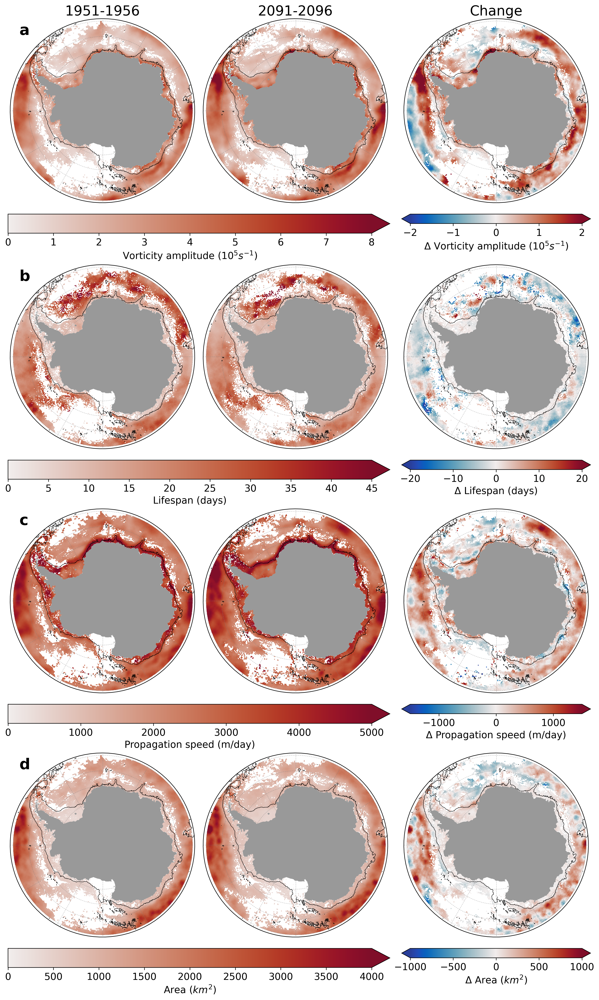

In [29]:
fig,axes=simple_plot(dpi=300,
                ygridlocs=[-80,-75,-70,-65,-60],
                figsize=(12,20),
                box=[-180,180,-80,-59],
                rows=4,
                cols=3)

titlesize=20
axes[0,0].set_title('1951-1956',fontsize=titlesize)
axes[0,1].set_title('2091-2096',fontsize=titlesize)
axes[0,2].set_title('Change',fontsize=titlesize)

plt.rc('xtick',labelsize=14)
plt.rc('ytick',labelsize=14)
plt.rc('axes',labelsize=14)

#land mask
for ax in axes.flatten():
    ax.add_geometries(mesh.lsmask_p, crs=ccrs.PlateCarree(), 
                              facecolor=[0.6,0.6,0.6], edgecolor='none' ,linewidth=1,zorder=100)
for num,ax in enumerate(axes[:,0]):
    ax.annotate(labels[num], xy=(0.05, 0.9),xycoords='axes fraction',horizontalalignment='left', 
                     verticalalignment='bottom',fontsize=22,weight='bold')

data0_50,data0_90=amp_50_binned_nns,amp_90_binned_nns
data1_50,data1_90=lts_50_binned_nns,lts_90_binned_nns
data2_50,data2_90=dailyspeed_50_binned_nns,dailyspeed_90_binned_nns
data3_50,data3_90=area_50_binned_nns,area_90_binned_nns

#presence
#contourf plots
cax_0=axes[0,0].pcolormesh(lons,lats,data0_50.T*10e5,vmin=0,vmax=8,cmap=rm,transform=ccrs.PlateCarree())
axes[0,1].pcolormesh(lons,lats,data0_90.T*10e5,vmin=0,vmax=8,cmap=rm,transform=ccrs.PlateCarree())
dax_0=axes[0,2].pcolormesh(lons,lats,data0_90.T*10e5-data0_50.T*10e5,vmin=-2,vmax=2,cmap=rbm,transform=ccrs.PlateCarree())

#row 0 colorbars
plt.colorbar(cax_0,ax=axes[0,:2],orientation='horizontal',label='Vorticity amplitude ($10^5 s^{-1}$)',extend='max')
plt.colorbar(dax_0,ax=axes[0,2],orientation='horizontal',label='Δ Vorticity amplitude ($10^5 s^{-1}$)',extend='both')

#lifespan
cax_1=axes[1,0].pcolormesh(lons,lats,data1_50.T,vmin=0,vmax=45,cmap=rm,transform=ccrs.PlateCarree())
axes[1,1].pcolormesh(lons,lats,data1_90.T,vmin=0,vmax=45,cmap=rm,transform=ccrs.PlateCarree())
dax_1=axes[1,2].pcolormesh(lons,lats,data1_90.T-data1_50.T,vmin=-20,vmax=20,cmap=rbm,transform=ccrs.PlateCarree())

#row 1 colorbars
plt.colorbar(cax_1,ax=axes[1,:2],orientation='horizontal',label='Lifespan (days)',extend='max')
plt.colorbar(dax_1,ax=axes[1,2],orientation='horizontal',label='Δ Lifespan (days)',extend='both')

#speed
cax_2=axes[2,0].pcolormesh(lons,lats,data2_50.T,vmin=0,vmax=5000,cmap=rm,transform=ccrs.PlateCarree())
axes[2,1].pcolormesh(lons,lats,data2_90.T,vmin=0,vmax=5000,cmap=rm,transform=ccrs.PlateCarree())
dax_2=axes[2,2].pcolormesh(lons,lats,data2_90.T-data2_50.T,vmin=-1500,vmax=1500,cmap=rbm,transform=ccrs.PlateCarree())

#row 2 colorbars
plt.colorbar(cax_2,ax=axes[2,:2],orientation='horizontal',label='Propagation speed (m/day)',extend='max')
plt.colorbar(dax_2,ax=axes[2,2],orientation='horizontal',label='Δ Propagation speed (m/day)',extend='both')

#Area
cax_3=axes[3,0].pcolormesh(lons,lats,data3_50.T,vmin=0,vmax=4000,cmap=rm,transform=ccrs.PlateCarree())
axes[3,1].pcolormesh(lons,lats,data3_90.T,vmin=0,vmax=4000,cmap=rm,transform=ccrs.PlateCarree())
dax_3=axes[3,2].pcolormesh(lons,lats,data3_90.T-data3_50.T,vmin=-1000,vmax=1000,cmap=rbm,transform=ccrs.PlateCarree())

#row 3 colorbars
plt.colorbar(cax_3,ax=axes[3,:2],orientation='horizontal',label='Area ($km^2$)',extend='max')
plt.colorbar(dax_3,ax=axes[3,2],orientation='horizontal',label='Δ Area ($km^2$)',extend='both')

for ax in axes.flatten():
    ax.tricontour(mesh.n_x,mesh.n_y,mesh.n_z,levels=[-2200],linewidths=0.5,colors='k',transform=ccrs.PlateCarree())

# 
plt.savefig(figpath+'figure_3.png',bbox_inches='tight')

In [30]:
#presence

In [31]:
deltalon_50=[track['lon'][-1]-track['lon'][0] for track in non_station_50]
deltalon_90=[track['lon'][-1]-track['lon'][0] for track in non_station_90]

deltalat_50=[track['lat'][-1]-track['lat'][0] for track in non_station_50]
deltalat_90=[track['lat'][-1]-track['lat'][0] for track in non_station_90]

#eddy propagation large
deltalonlb_50_binned=st.binned_statistic_2d(lonb50,latb50,deltalon_50,statistic='mean',bins=[np.arange(-180,181,8),np.arange(-78,-59,2.5)],expand_binnumbers=True)
deltalonlb_90_binned=st.binned_statistic_2d(lonb90,latb90,deltalon_90,statistic='mean',bins=[np.arange(-180,181,8),np.arange(-78,-59,2.5)],expand_binnumbers=True)

#eddy propagation large
deltalatlb_50_binned=st.binned_statistic_2d(lonb50,latb50,deltalat_50,statistic='mean',bins=[np.arange(-180,181,8),np.arange(-78,-59,2.5)],expand_binnumbers=True)
deltalatlb_90_binned=st.binned_statistic_2d(lonb90,latb90,deltalat_90,statistic='mean',bins=[np.arange(-180,181,8),np.arange(-78,-59,2.5)],expand_binnumbers=True)

propsslb_50_binned=st.binned_statistic_2d(lonb50,latb50,deltalat_50,statistic='count',bins=[np.arange(-180,181,8),np.arange(-78,-59,2.5)],expand_binnumbers=True)
propsslb_90_binned=st.binned_statistic_2d(lonb90,latb90,deltalat_50,statistic='count',bins=[np.arange(-180,181,8),np.arange(-78,-59,2.5)],expand_binnumbers=True)

alph50lb=[0.8 if al>50 else 0 for al in propsslb_50_binned[0].flatten() ]
alph90lb=[0.8 if al>50 else 0 for al in propsslb_90_binned[0].flatten() ]

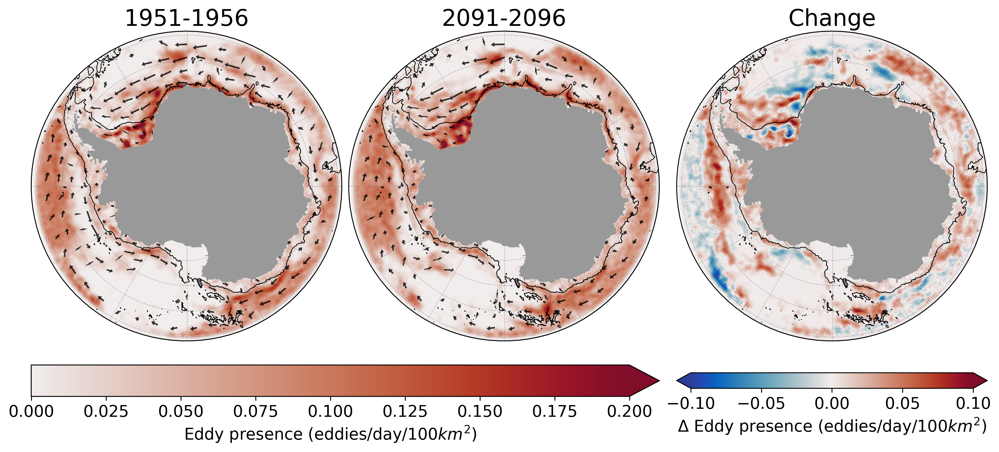

In [32]:
fig,axes=simple_plot(dpi=300,
                ygridlocs=[-80,-75,-70,-65,-60],
                figsize=(12,6),
                box=[-180,180,-80,-59],
                rows=1,
                cols=3)

#titles on first row
titlesize=20
axes[0].set_title('1951-1956',fontsize=titlesize)
axes[1].set_title('2091-2096',fontsize=titlesize)
axes[2].set_title('Change',fontsize=titlesize)

plt.rc('xtick',labelsize=14)
plt.rc('ytick',labelsize=14)
plt.rc('axes',labelsize=14)

#land mask
for ax in axes.flatten():
    ax.add_geometries(mesh.lsmask_p, crs=ccrs.PlateCarree(), 
                              facecolor=[0.6,0.6,0.6], edgecolor='none' ,linewidth=1,zorder=100)
    ax.tricontour(mesh.n_x,mesh.n_y,mesh.n_z,levels=[-2200],linewidths=0.5,colors='k',transform=ccrs.PlateCarree())
    
data0_50,data0_90=(ep_50_binned_nns/((365*6)+2))/(bin_areas[:-1,:].T/1000),(ep_90_binned_nns/((365*6)+2))/(bin_areas[:-1,:].T/1000) #eddies/day/km^2 - 2 leap years
data0_dif=data0_90.T-data0_50.T

#presence
#contourf plots
cax_0=axes[0].pcolormesh(lons,lats,data0_50.T,vmin=0,vmax=0.2,cmap=rm,transform=ccrs.PlateCarree())
axes[1].pcolormesh(lons,lats,data0_90.T,vmin=0,vmax=0.2,cmap=rm,transform=ccrs.PlateCarree())
dax_0=axes[2].pcolormesh(lons,lats,data0_dif,vmin=-0.1,vmax=0.1,cmap=rbm,transform=ccrs.PlateCarree())

#propagation
starterlons,starterlats=np.meshgrid(deltalonlb_50_binned[1][:-1]+4,deltalonlb_50_binned[2][:-1]+1.25)
for i in np.arange(0,len(starterlons.T.flatten())):
    if np.isnan(deltalonlb_50_binned[0].flatten()[i]) or np.isnan(deltalatlb_50_binned[0].flatten()[i]) :
        continue
    else:
        axes[0].arrow(starterlons.T.flatten()[i],starterlats.T.flatten()[i],
             (deltalonlb_50_binned[0]*4).flatten()[i],(deltalatlb_50_binned[0]*4).flatten()[i],
             facecolor='k',edgecolor='none',transform=ccrs.PlateCarree(),width=0.3,length_includes_head=False,label='eddy trajectories',
                     alpha=alph50lb[i])
        
starterlons,starterlats=np.meshgrid(deltalonlb_90_binned[1][:-1]+4,deltalonlb_90_binned[2][:-1]+1.25)
for i in np.arange(0,len(starterlons.T.flatten())):
    if np.isnan(deltalonlb_90_binned[0].flatten()[i]) or np.isnan(deltalatlb_90_binned[0].flatten()[i]) :
        continue
    else:
        axes[1].arrow(starterlons.T.flatten()[i],starterlats.T.flatten()[i],
             (deltalonlb_90_binned[0]*4).flatten()[i],(deltalatlb_90_binned[0]*4).flatten()[i],
             facecolor='k',edgecolor='none',transform=ccrs.PlateCarree(),width=0.3,length_includes_head=False,label='eddy trajectories',
                     alpha=alph90lb[i])

#row 0 colorbars
plt.colorbar(cax_0,ax=axes[:2],orientation='horizontal',label='Eddy presence (eddies/day/100$km^2$)',extend='max')
plt.colorbar(dax_0,ax=axes[2],orientation='horizontal',label='Δ Eddy presence (eddies/day/100$km^2$)',extend='both',pad=0.07)

plt.savefig(figpath+'figure_1.png',bbox_inches='tight')